# **Mineração de dados em Redes Sociais - Twitter**

Este notebook tem o objetivo de demonstrar a utilização da API disponibilizada pelo Twitter para consumo de informações.

## **Roteiro**

1. Autenticação na API
2. Primeiro contato com a API
2. Apresentação dos métodos `home_timeline()` e `user_timeline()`
3. Apresentação do método `trends_place()`
4. Apresentação do método `search()`
5. Apresentação do método do objeto `Cursor`
6. Anatomia de um tweet
7. Captura de tweets em streaming
8. Estudo de caso

## Autenticação na API

In [ ]:
# Tweepy é a biblioteca que comunica com a API do Twitter
import tweepy
from tweepy import OAuthHandler, Stream, StreamListener, Cursor
import datetime
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import re
import networkx as nx

# Configuração das chaves
twitter_keys = {
        'consumer_key' : '<consumer_key_do_usuario>',
        'consumer_secret' : '<consumer_secret_do_usuario>',
        'access_token_key' : '<access_token_key_do_usuario>',
        'access_token_secret' : '<access_token_secret_do_usuario>'
    }

# Configuração do acesso
auth = OAuthHandler(twitter_keys['consumer_key'], twitter_keys['consumer_secret'])
auth.set_access_token(twitter_keys['access_token_key'], twitter_keys['access_token_secret'])

# Instanciação do objeto "api" para condução das consultas 
api = tweepy.API(auth)

In [ ]:
api

## Primeiro contato com a API

O primeiro método a ser explorado é o **`get_user()`**, que recupera o objeto com as informações sobre uma conta de usuário.

Informações sobre esse objeto na [documentação](https://developer.twitter.com/en/docs/twitter-api/v1/data-dictionary/object-model/user).

In [ ]:
# Como parâmetro pode ser passado o nome da conta ou o id
bill_gates = api.get_user('BillGates')

In [ ]:
bill_gates.id

50393960

In [ ]:
api.get_user(bill_gates.id)

User(_api=<tweepy.api.API object at 0x7fb8bee1efd0>, _json={'id': 50393960, 'id_str': '50393960', 'name': 'Bill Gates', 'screen_name': 'BillGates', 'location': 'Seattle, WA', 'profile_location': {'id': '300bcc6e23a88361', 'url': 'https://api.twitter.com/1.1/geo/id/300bcc6e23a88361.json', 'place_type': 'unknown', 'name': 'Seattle, WA', 'full_name': 'Seattle, WA', 'country_code': '', 'country': '', 'contained_within': [], 'bounding_box': None, 'attributes': {}}, 'description': "Sharing things I'm learning through my foundation work and other interests.", 'url': 'https://t.co/UkvHzxUzmH', 'entities': {'url': {'urls': [{'url': 'https://t.co/UkvHzxUzmH', 'expanded_url': 'https://gatesnot.es/blog', 'display_url': 'gatesnot.es/blog', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 56285083, 'friends_count': 342, 'listed_count': 121578, 'created_at': 'Wed Jun 24 18:44:10 +0000 2009', 'favourites_count': 192, 'utc_offset': None, 'time_zone': None, 'ge

In [ ]:
# quantidade de perfis seguidos
bill_gates.friends_count

342

In [ ]:
# quantidade de seguidores
bill_gates.followers_count

56285079

In [ ]:
# quantidade de posts favoritados
bill_gates.favourites_count

192

In [ ]:
# Se a conta de usuário é verificada
bill_gates.verified

True

In [ ]:
# login
bill_gates.screen_name

'BillGates'

In [ ]:
# nome da conta
bill_gates.name

'Bill Gates'

In [ ]:
# Seleciona 20 perfis seguidos
bill_gates.friends()

[User(_api=<tweepy.api.API object at 0x7fb8bee1efd0>, _json={'id': 1318667193656041472, 'id_str': '1318667193656041472', 'name': 'GatesWA', 'screen_name': 'GatesWA', 'location': 'Seattle', 'description': "We are impatient optimists working to help every child reach their full potential. Washington state isn't just our headquarters, it's our home.", 'url': 'https://t.co/9DMzdlbk7v', 'entities': {'url': {'urls': [{'url': 'https://t.co/9DMzdlbk7v', 'expanded_url': 'https://local.gatesfoundation.org/', 'display_url': 'local.gatesfoundation.org', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 880, 'friends_count': 312, 'listed_count': 2, 'created_at': 'Tue Oct 20 21:35:46 +0000 2020', 'favourites_count': 262, 'utc_offset': None, 'time_zone': None, 'geo_enabled': False, 'verified': False, 'statuses_count': 543, 'lang': None, 'status': {'created_at': 'Wed Dec 01 20:52:56 +0000 2021', 'id': 1466148333135663104, 'id_str': '1466148333135663104', 'text

In [ ]:
# Selecionar 20 seguidores
bill_gates.followers()

[User(_api=<tweepy.api.API object at 0x7fb8bee1efd0>, _json={'id': 1466345836346937350, 'id_str': '1466345836346937350', 'name': 'Nimisha Menon', 'screen_name': '_nimishamenon_', 'location': '', 'description': '', 'url': None, 'entities': {'description': {'urls': []}}, 'protected': False, 'followers_count': 0, 'friends_count': 111, 'listed_count': 0, 'created_at': 'Thu Dec 02 09:58:07 +0000 2021', 'favourites_count': 0, 'utc_offset': None, 'time_zone': None, 'geo_enabled': False, 'verified': False, 'statuses_count': 0, 'lang': None, 'contributors_enabled': False, 'is_translator': False, 'is_translation_enabled': False, 'profile_background_color': 'F5F8FA', 'profile_background_image_url': None, 'profile_background_image_url_https': None, 'profile_background_tile': False, 'profile_image_url': 'http://abs.twimg.com/sticky/default_profile_images/default_profile_normal.png', 'profile_image_url_https': 'https://abs.twimg.com/sticky/default_profile_images/default_profile_normal.png', 'profile

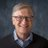

In [ ]:
# Mostrar a foto do perfil
from IPython.display import Image
Image(bill_gates.profile_image_url)

In [ ]:
# quantidade de tweets do usuário
bill_gates.statuses_count

3729

Explore outros perfis para se familiarizar com os métodos da API.



## Apresentação do métodos `home_timeline()` e `user_timeline()`

O método a ser explorado é o que recupera os tweets da `timeline` do usuário logado, isto é, os tweets e retweets publicados propriamente e outros post recomendados pelo Twitter de acordo com os rastros do usuário.

In [ ]:
api.home_timeline()

[Status(_api=<tweepy.api.API object at 0x7fb8bee1efd0>, _json={'created_at': 'Wed Dec 01 22:16:37 +0000 2021', 'id': 1466169391322734601, 'id_str': '1466169391322734601', 'text': 'Começou! Está oficialmente aberta a Primeira Jornada de Ciência de Dados e Inteligência Artificial de Brasília. Ass… https://t.co/5XpDuHRrhF', 'truncated': True, 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/5XpDuHRrhF', 'expanded_url': 'https://twitter.com/i/web/status/1466169391322734601', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}]}, 'source': '<a href="https://mobile.twitter.com" rel="nofollow">Twitter Web App</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 172441816, 'id_str': '172441816', 'name': 'Centro Universitário IESB', 'screen_name': 'IESB_oficial', 'location': 'Brasília, Brasil', 'descripti

O método `user_timeline()` apresenta os tweets postados pelo usuário. Como parâmetro deve ser passado o nome da conta ou o *id* identificador.

In [ ]:
api.user_timeline('billgates')

[Status(_api=<tweepy.api.API object at 0x7fb8bee1efd0>, _json={'created_at': 'Tue Nov 30 20:22:50 +0000 2021', 'id': 1465778366707998721, 'id_str': '1465778366707998721', 'text': 'Accelerating long-duration energy storage innovation can significantly reduce annual CO2 emissions and lay the foun… https://t.co/FIpWg3RoF7', 'truncated': True, 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/FIpWg3RoF7', 'expanded_url': 'https://twitter.com/i/web/status/1465778366707998721', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}]}, 'source': '<a href="https://mobile.twitter.com" rel="nofollow">Twitter Web App</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 50393960, 'id_str': '50393960', 'name': 'Bill Gates', 'screen_name': 'BillGates', 'location': 'Seattle, WA', 'description': "Sharing things I'm 

## Apresentação do método `trends_place()`

O método `trends_place` recupera os chamados *trend topics* do momento, com a possibilidade de indicar a localização a ser consultada.

O parâmetro passado é o [***WOEID***](https://pt.wikipedia.org/wiki/WOEID#:~:text=Um%20WOEID%20(em%20ingl%C3%AAs%2C%20Where,identifica%20qualquer%20caracter%C3%ADstica%20da%20Terra)
do local. o WOEID mundial é o 1.

A consulta traz os **50** tópicos mais populares do momento.

In [ ]:
api.trends_place(1)

Para facilitar o consumo da informação vamos colocar em um DataFrame:

In [ ]:
tt = pd.DataFrame(api.trends_place(1)[0]['trends'])
tt

,name,url,promoted_content,query,tweet_volume
0,WOOZI,http://twitter.com/search?q=WOOZI,None,WOOZI,61560.0
1,hobi,http://twitter.com/search?q=hobi,None,hobi,407762.0
2,#いいねかRTで気になった人フォローする,http://twitter.com/search?q=%23%E3%81%84%E3%81...,None,%23%E3%81%84%E3%81%84%E3%81%AD%E3%81%8BRT%E3%8...,39133.0
3,#Premios3DJuegosHuawei,http://twitter.com/search?q=%23Premios3DJuegos...,None,%23Premios3DJuegosHuawei,NaN
4,#2021AAAxBamBam,http://twitter.com/search?q=%232021AAAxBamBam,None,%232021AAAxBamBam,242863.0
5,#김선호_너라는_이유,http://twitter.com/search?q=%23%EA%B9%80%EC%84...,None,%23%EA%B9%80%EC%84%A0%ED%98%B8_%EB%84%88%EB%9D...,13965.0
6,KimSeonHo MostPopularAAActor,http://twitter.com/search?q=%22KimSeonHo+MostP...,None,%22KimSeonHo+MostPopularAAActor%22,14320.0
7,#ActorDoyoungonAAA,http://twitter.com/search?q=%23ActorDoyoungonAAA,None,%23ActorDoyoungonAAA,146858.0
8,Halsey,http://twitter.com/search?q=Halsey,None,Halsey,855099.0
9,LOVE IS COLORBLIND TRAILER,http://twitter.com/search?q=%22LOVE+IS+COLORBL...,None,%22LOVE+IS+COLORBLIND+TRAILER%22,34787.0


Nem todas localidades possuem essa informação dos seus *trend topics*. Para consultar as localidades disponíveis, a API fornece um método `trends_available()`, que retorna os *WOEID* das localidades dispníveis. 



In [ ]:
places_id = api.trends_available()

In [ ]:
# Quantidade de locais disponíveis 
len(places_id)

467

São **467** locais que podem ser pesquisados para verificar os *trend topics*.

In [ ]:
places_id

[{'country': '',
  'countryCode': None,
  'name': 'Worldwide',
  'parentid': 0,
  'placeType': {'code': 19, 'name': 'Supername'},
  'url': 'http://where.yahooapis.com/v1/place/1',
  'woeid': 1},
 {'country': 'Canada',
  'countryCode': 'CA',
  'name': 'Winnipeg',
  'parentid': 23424775,
  'placeType': {'code': 7, 'name': 'Town'},
  'url': 'http://where.yahooapis.com/v1/place/2972',
  'woeid': 2972},
 {'country': 'Canada',
  'countryCode': 'CA',
  'name': 'Ottawa',
  'parentid': 23424775,
  'placeType': {'code': 7, 'name': 'Town'},
  'url': 'http://where.yahooapis.com/v1/place/3369',
  'woeid': 3369},
 {'country': 'Canada',
  'countryCode': 'CA',
  'name': 'Quebec',
  'parentid': 23424775,
  'placeType': {'code': 7, 'name': 'Town'},
  'url': 'http://where.yahooapis.com/v1/place/3444',
  'woeid': 3444},
 {'country': 'Canada',
  'countryCode': 'CA',
  'name': 'Montreal',
  'parentid': 23424775,
  'placeType': {'code': 7, 'name': 'Town'},
  'url': 'http://where.yahooapis.com/v1/place/3534',

Vamos transformar em um DataFrame para consumir essa informação de 
forma mais fácil.

In [ ]:
df_places = pd.DataFrame(places_id)

In [ ]:
df_places

,name,placeType,url,parentid,country,woeid,countryCode
0,Worldwide,"{'code': 19, 'name': 'Supername'}",http://where.yahooapis.com/v1/place/1,0,,1,None
1,Winnipeg,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/2972,23424775,Canada,2972,CA
2,Ottawa,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/3369,23424775,Canada,3369,CA
3,Quebec,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/3444,23424775,Canada,3444,CA
4,Montreal,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/3534,23424775,Canada,3534,CA
...,...,...,...,...,...,...,...
462,Vietnam,"{'code': 12, 'name': 'Country'}",http://where.yahooapis.com/v1/place/23424984,1,Vietnam,23424984,VN
463,Petaling,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/56013632,23424901,Malaysia,56013632,MY
464,Hulu Langat,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/56013645,23424901,Malaysia,56013645,MY
465,Ahsa,"{'code': 9, 'name': 'Unknown'}",http://where.yahooapis.com/v1/place/56120136,23424938,Saudi Arabia,56120136,SA


In [ ]:
# Por curiosidade, qual seria a distribuição da quantidade de WOEID por país??
df_places.country.value_counts()

United States     64
United Kingdom    27
Mexico            24
Japan             22
India             22
                  ..
Qatar              1
Kuwait             1
Panama             1
Puerto Rico        1
                   1
Name: country, Length: 63, dtype: int64

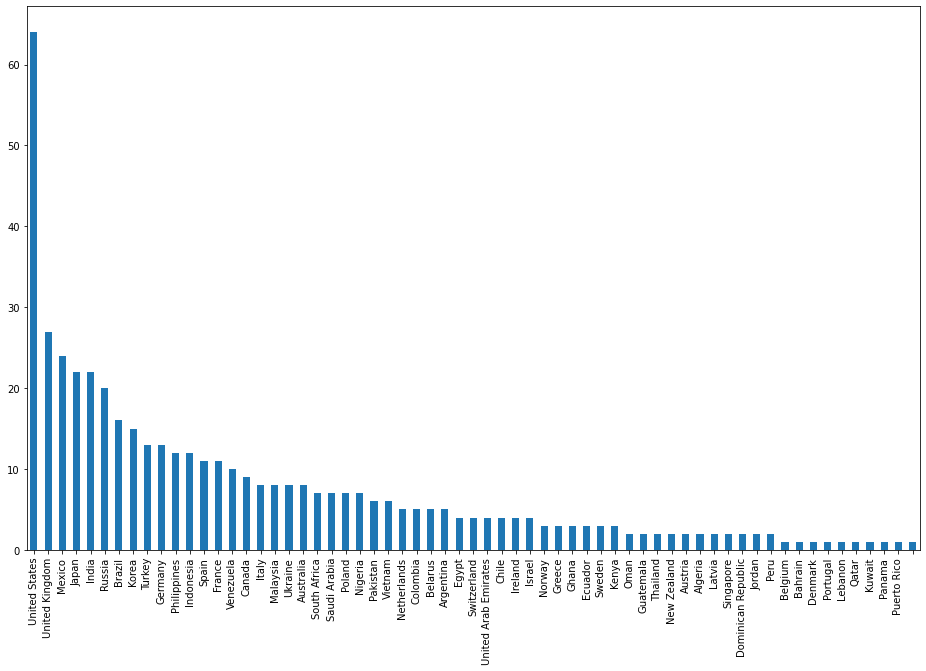

In [ ]:
plt.figure(figsize=(16,10))
df_places.country.value_counts().plot(kind = 'bar')

Segue a relação dos *WOEID* do Brasil.

In [ ]:
df_places[df_places.country == 'Brazil']

,name,placeType,url,parentid,country,woeid,countryCode
78,Brasília,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455819,23424768,Brazil,455819,BR
79,Belém,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455820,23424768,Brazil,455820,BR
80,Belo Horizonte,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455821,23424768,Brazil,455821,BR
81,Curitiba,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455822,23424768,Brazil,455822,BR
82,Porto Alegre,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455823,23424768,Brazil,455823,BR
83,Recife,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455824,23424768,Brazil,455824,BR
84,Rio de Janeiro,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455825,23424768,Brazil,455825,BR
85,Salvador,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455826,23424768,Brazil,455826,BR
86,São Paulo,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455827,23424768,Brazil,455827,BR
87,Campinas,"{'code': 7, 'name': 'Town'}",http://where.yahooapis.com/v1/place/455828,23424768,Brazil,455828,BR


São 15 possibilidades de pesquisa mais focada e 1 no país inteiro. Para efeito de comparação, nos US são 63.

In [ ]:
woeid_brasil = df_places[df_places.name=='Brazil'].woeid.values[0]
api.trends_place(woeid_brasil)

Outro método interessante é o `trends_closest()` que retorna o *WOEID* disponível mais próximo do ponto cartesiano passado.

In [ ]:
# Pirenópolis -15.85616620925471, -48.970608364270404
api.trends_closest(-8.617252263342444, -44.71963920107556)

[{'country': 'Brazil',
  'countryCode': 'BR',
  'name': 'São Luís',
  'parentid': 23424768,
  'placeType': {'code': 7, 'name': 'Town'},
  'url': 'http://where.yahooapis.com/v1/place/455834',
  'woeid': 455834}]

Você pode validar o funcionamento desse método utilizando localizações obtidas no GoogleMaps.

***Não funciona bem para Brasília...***

Quais seriam os *Trend Topics* de Brasília, nesse momento??

Focando nos *Trend Topics*:

Podemos colocar o conteúdo em um Dataframe para visualizar as informações de forma mais clara.

Compare os *Trend Topics* de duas localidades, verificando quais coincidem.

## Apresentação do método `search()`

O método `search()` efetua a pesquisa na base de tweets segundo uma *query* proposta. 

Destaca-se que, no nível de acesso padrão, a pesquisa se limita a tweets de até 7 dias atrás.

A cada chamada ao método, o limite de tweets retornados é **100**, parâmetro a ser definido em *count*.

A *query* apresentar estruturas do tipo:

- *(termo1 OR termo2)*

- *(termo1 AND termo2)*

E outras como:
- *(happy OR happiness OR excited) lang:en -birthday -is:retweet*

In [ ]:
# Exemplo: Tweets citem "Flamengo" em português que não citem "LIbertadores" nem "Palmeiras"
q = 'Flamengo lang:pt -Palmeiras -Libertadores'
count = 15

from urllib.parse import unquote

results = api.search(q = q, count = count)
results

[Status(_api=<tweepy.api.API object at 0x7fb8bee1efd0>, _json={'created_at': 'Thu Dec 02 10:38:18 +0000 2021', 'id': 1466356042745458688, 'id_str': '1466356042745458688', 'text': 'RT @delaurentiis_br: Aí é foda... não tem como comparar mesmo.\nO Flamengo nunca caiu.', 'truncated': False, 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'delaurentiis_br', 'name': 'De Laurentis', 'id': 64458973, 'id_str': '64458973', 'indices': [3, 19]}], 'urls': []}, 'metadata': {'iso_language_code': 'pt', 'result_type': 'recent'}, 'source': '<a href="https://mobile.twitter.com" rel="nofollow">Twitter Web App</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 2863798639, 'id_str': '2863798639', 'name': 'Senhor Kaioh', 'screen_name': 'caio18alves', 'location': 'Nova Lima, Brasil', 'description': 'Esforça-te!\n\n\n@flamengo ❤️🖤', 'url': 'https://t.

In [ ]:
len(results)

15

In [ ]:
results[10]._json

{'contributors': None,
 'coordinates': None,
 'created_at': 'Thu Dec 02 10:37:59 +0000 2021',
 'entities': {'hashtags': [],
  'symbols': [],
  'urls': [],
  'user_mentions': [{'id': 55069015,
    'id_str': '55069015',
    'indices': [3, 14],
    'name': 'Mauro Cezar',
    'screen_name': 'maurocezar'}]},
 'favorite_count': 0,
 'favorited': False,
 'geo': None,
 'id': 1466355961602445320,
 'id_str': '1466355961602445320',
 'in_reply_to_screen_name': None,
 'in_reply_to_status_id': None,
 'in_reply_to_status_id_str': None,
 'in_reply_to_user_id': None,
 'in_reply_to_user_id_str': None,
 'is_quote_status': False,
 'lang': 'pt',
 'metadata': {'iso_language_code': 'pt', 'result_type': 'recent'},
 'place': None,
 'retweet_count': 616,
 'retweeted': False,
 'retweeted_status': {'contributors': None,
  'coordinates': None,
  'created_at': 'Wed Dec 01 15:30:54 +0000 2021',
  'entities': {'hashtags': [],
   'symbols': [],
   'urls': [{'display_url': 'twitter.com/i/web/status/1…',
     'expanded_u

In [ ]:
type(results)

tweepy.models.SearchResults

In [ ]:
type(results[0])

tweepy.models.Status

Para que o texto do tweet não venha truncado, deve ser passado o parâmetro `tweet_mode='extended'` no campo da fórmula da query. 

[Aqui](https://developer.twitter.com/en/docs/twitter-api/tweets/search/integrate/build-a-query) são apresentados váris tipos de expressão a serem indicados no parâmetro `query`.

## Apresentação do objeto `Cursor`

A API limita a quantidade de resultados por chamada, mas oferece a possibilidade de capturar mais resultados por meio de paginação. Ou seja, mais resultados são retornados sem repetir os que já foram apresentados.

O ***Tweepy*** implementa a paginação por meio do objeto chamado `Cursor`.

Utilizando o `Cursor` mais tweets posdem ser recuperados, até os limites estabelecidos pela API.

Para mias informações sobre os limites de dados da API, counsultar [aqui](https://developer.twitter.com/en/docs/twitter-api/rate-limits).

Vamos efetuar a mesma pesquisa do item anterior, mas agora retornando 1000 tweets.

In [ ]:
tweets_results = []
q = 'Flamengo lang:pt -Palmeiras -Libertadores'
count = 100
i = 1
for tweet in tweepy.Cursor(api.search, q = q, count = count, tweet_mode='extended').items(1000):
  tweets_results.append(tweet)

In [ ]:
len(tweets_results)

1000

In [ ]:
tweets_results = []
q = 'Flamengo lang:pt -Palmeiras -Libertadores'
count = 100
i = 1
for tweet in tweepy.Cursor(api.search, q = q, count = count, tweet_mode='extended').items(1000):
  tweets_results.append(tweet)

0
100
200
300
400
500
600
699
799
899
999
1099
1199
1299
1399
1499
1599
1699
1799
1899
1999
2099
2199
2299
2399
2499
2599
2699
2799
2899
2999
3099
3199
3299
3399
3499
3599
3699
3799
3899
3999
4099
4199
4299
4399
4499
4599
4699
4799
4899
4999
5099
5199
5299
5399
5499
5599
5699
5799
5899
5999
6099
6199
6299
6399
6499
6599
6699
6799
6899
6999
7099
7199
7299
7399
7499
7599
7699
7799
7899
7999
8099
8199
8299
8399
8499
8599
8699
8799
8899
8999
9099
9199
9299
9399
9499
9599
9699
9799
9899
9999
10099
10199
10299
10399
10499
10599
10699
10799
10899
10999
11099
11199
11299
11399
11499
11599
11699
11799
11899
11999
12099
12199
12299
12399
12499
12599
12699
12799
12899
12999
13099
13199
13299
13399
13499
13599
13699
13799
13899
13999
14099
14199
14299
14399
14499
14599
14699
14799
14899
14999
15099
15199
15299
15399
15499
15599
15699
15799
15899
15999
16099
16199
16299
16399


TweepError: ignored

O `Cursor` pode ser utilizado para outros métodos da API, como para recuperar a lista de perfis seguidos ou seguidores:

In [ ]:
# Sem o Cursor o resultado se limita a 5000
len(api.followers_ids('billGates', count=5000))

5000

In [ ]:
bill_gates_followers_ids=[]
for follower in tweepy.Cursor(api.followers_ids, screen_name="billGates").pages(10):
  bill_gates_followers_ids.extend(follower)

RateLimitError: ignored

In [ ]:
len(bill_gates_followers_ids)

50000

## Anatomia de um Tweet

Cada tweet apresenta os seguintes campos: 
https://developer.twitter.com/en/docs/twitter-api/v1/data-dictionary/object-model/tweet

* created_at
* id / id_str
* text / full_text
* source
* truncated
* in_reply_to_status_id / in_reply_to_status_id_str
* in_reply_to_user_id / in_reply_to_user_id_str
* in_reply_to_screen_name
* user [id, name, screen_name, location, url, verified, followers_count, friends_count, listed_count, favourites_count,...]  
* coordinates
* place
* quoted_status_id / quoted_status_id_str
* quote_count
* reply_count
* retweet_count
* entities
* extended_entities
* favorited
* retweeted
* possibly_sensitive
* filter_level
* lang






Para verificar os campos, vamos pegar os tweets capturados no tópico anterior e criar um dataframe com os campos que interessem:

**created_at, text, user.name, user.screen_name, user.verified, user.followers_count, retweet_count, favorited, retweeted**

Cada tweet será representado em um dicionário.

In [ ]:
list_tweets = []
for item in tweets_results:
  tweet = {}
  tweet['created_at'] = item.created_at
  tweet['text']=item.full_text
  tweet['user_name'] = item.user.name
  tweet['user_screen_name'] = item.user.screen_name
  tweet['user_verified'] = item.user.verified
  tweet['user_followers_count'] = item.user.followers_count
  tweet['retweet_count']=item.retweet_count
  tweet['favorited'] = item.favorited
  tweet['retweeted'] = item.retweeted
  tweet['users_mentioned'] = item.entities['user_mentions']
  list_tweets.append(tweet)

In [ ]:
df_tweets = pd.DataFrame(list_tweets)

In [ ]:
df_tweets.head()

,created_at,text,user_name,user_screen_name,user_verified,user_followers_count,retweet_count,favorited,retweeted,users_mentioned
0,2021-12-02 01:18:01,gremio ganhando na última rodada e flamengo ca...,gustabo,taeyeonys,False,824,0,False,False,[]
1,2021-12-02 01:18:01,É o seguinte: quem vai no jogo comigo segunda\...,legea,_ligiamcarvalho,False,1301,0,False,False,[]
2,2021-12-02 01:18:00,"RT @leoffmiranda: Um minuto ANTES do gol, acon...",Palestrino_Fanatico_2021,2021Fanatico,False,51,3,False,False,"[{'screen_name': 'leoffmiranda', 'name': 'Leon..."
3,2021-12-02 01:18:00,RT @GersonKoringa: Único time que marcou mais ...,Italoᶜʳᶠ,ItaloBMendes,False,2235,96,False,False,"[{'screen_name': 'GersonKoringa', 'name': 'Ger..."
4,2021-12-02 01:17:58,RT @GabigoIlI_: Me odeia só pq em 3 anos de Fl...,𝙱𝚒𝚊𝚗𝚔𝚎𝚝𝚎 ᶜʳᶠ,biancagenelhu,False,220,4248,False,False,"[{'screen_name': 'GabigoIlI_', 'name': 'Gabi 🍥..."


In [ ]:
df_tweets.dtypes

created_at              datetime64[ns]
text                            object
user_name                       object
user_screen_name                object
user_verified                     bool
user_followers_count             int64
retweet_count                    int64
favorited                         bool
retweeted                         bool
users_mentioned                 object
dtype: object

In [ ]:
# Para explorar a coluna "users mentioned"
users_mentiones_expanded = df_tweets["users_mentioned"].apply(pd.Series)

In [ ]:
df_tweets.users_mentioned[2:4]

2    [{'screen_name': 'leoffmiranda', 'name': 'Leon...
3    [{'screen_name': 'GersonKoringa', 'name': 'Ger...
Name: users_mentioned, dtype: object

In [ ]:
# Ordener o tweets pelo número de seguidores do autor
df_tweets.sort_values('user_followers_count', ascending = False)

,created_at,text,user_name,user_screen_name,user_verified,user_followers_count,retweet_count,favorited,retweeted,users_mentioned
639,2021-12-02 01:10:33,Arrascaeta encontra torcedor do Flamengo que i...,Jornal Extra,jornalextra,True,1087227,1,False,False,[]
798,2021-12-02 01:08:43,RT @Ryan_Vitor12: meu pai (Marcilio Cesar Card...,Tozza,TozzaFla,False,176022,156,False,False,"[{'screen_name': 'Ryan_Vitor12', 'name': 'ryan..."
333,2021-12-02 01:14:02,📊 VOCÊ SABIA? 🤔\n\n– O clube que marcou mais g...,UrubuTTᶜʳᶠ,UrubuTT_,False,65519,27,False,False,[]
224,2021-12-02 01:15:24,Espero um dia ter condições de ser sócio contr...,Nanda Barbosa,nandabarbosacrf,False,51057,2,False,False,[]
621,2021-12-02 01:10:45,"Gostei muito do bate papo com o Ricardo, candi...",Nanda Barbosa,nandabarbosacrf,False,51057,5,False,False,[]
...,...,...,...,...,...,...,...,...,...,...
674,2021-12-02 01:10:03,RT @AnaVitr06848892: eu esperando o flamengo a...,Thales Almeida,ThalesA11416970,False,0,10,False,False,"[{'screen_name': 'AnaVitr06848892', 'name': 'a..."
669,2021-12-02 01:10:08,RT @meninasRN: Eu esperando o @venecasagrande ...,Thales Almeida,ThalesA11416970,False,0,4,False,False,"[{'screen_name': 'meninasRN', 'name': 'APAIXON..."
632,2021-12-02 01:10:38,RT @MeuMengaoOfc: Os ingressos p a torcida do ...,Thales Almeida,ThalesA11416970,False,0,4,False,False,"[{'screen_name': 'MeuMengaoOfc', 'name': 'Meu ..."
616,2021-12-02 01:10:47,"RT @marvim_LP: Voltar Mister para o Flamengo, ...",Thales Almeida,ThalesA11416970,False,0,12,False,False,"[{'screen_name': 'marvim_LP', 'name': 'Marvim ..."


In [ ]:
# Quantos tweets por usuário?
df_tweets.user_name.value_counts()

Thales Almeida             19
Lopes ᶜʳᶠ🙅🏾‍♂️⚫🔴            7
Karina                      7
🄲🄷🤑🍀                        5
Lucas A.                    5
                           ..
Vinicius Pereira            1
AG2🕊                        1
Douglas                     1
ana                         1
Jay Jay, The Lil Jet ✈️     1
Name: user_name, Length: 831, dtype: int64

In [ ]:
# Imprimir todos os textos dos tweets 
twitter_users = []
tweet_string = []
for tweet in tweets_results:
      twitter_users.append(tweet.user.name)
      tweet_string.append(tweet.full_text)
      print([tweet.user.name,tweet.full_text])

['gustabo', 'gremio ganhando na última rodada e flamengo campeão brasileiro omg 😱😱😱😱😱😬😬😬']
['legea', 'É o seguinte: quem vai no jogo comigo segunda\n\nFlamengo x Santos']
['Palestrino_Fanatico_2021', 'RT @leoffmiranda: Um minuto ANTES do gol, acontece isso: o Deyverson pressiona o David Luiz, o Rony pega o R. Caio e o Danilo Barbosa sai l…']
['Italoᶜʳᶠ', 'RT @GersonKoringa: Único time que marcou mais gols que o Flamengo em 2021 foi o Bayern de Munique. Eles marcaram 154 e o Flamengo marcou 14…']
['𝙱𝚒𝚊𝚗𝚔𝚎𝚝𝚎 ᶜʳᶠ', 'RT @GabigoIlI_: Me odeia só pq em 3 anos de Flamengo eu tenho mais títulos que seu time em 115 anos de vida?']
['je', 'RT @arcticsmk: hoje eu acordei com uma saudade desgramada dele 🥺 https://t.co/gcF0XbmQE3']
['7👹', 'RT @UrubuTT_: 🏆 Clubes do RJ com mais títulos nos últimos 10 anos:\n\n1° | Flamengo = 12 títulos\n2° | Vasco = 2 títulos\n3° | Fluminense = 2 t…']
['Gripp 🍻🔴⚫😎', 'RT @UrubuTT_: 🏆 Clubes do RJ com mais títulos nos últimos 10 anos:\n\n1° | Flamengo = 12 títulos\n2°

## Captura de tweets em *streaming*

Uma outra possibilidade oferecida pela API é a captura de tweets em tempo real, de acordo com a publicação.

No caso, são estabelecidos alguns termos de interesse e à medida que forem ocorrendo, eles são capturados e consumidos pelo usuário.

Para isso, deve ser criada uma subclasse da classe `StreamListener` do Tweepy e sobrescrever os métodos que sejam necessários para o comportamento desejado.

[Aqui](https://developer.twitter.com/en/docs/twitter-api/v1/tweets/filter-realtime/guides/basic-stream-parameters) podem ser encontrados os variados parâmetros a serem utilizados na filtragem dos tweets de interesse.

In [ ]:
# Se não forem incluídas vírgulas entre os termos, a interpretação é de 'AND'
# Com vírgulas, a interpretação é de 'OR'
TRACKING_KEYWORDS = ['Economia', 'Guedes']
TWEETS_TO_CAPTURE = 15

In [ ]:
class TweetListener(StreamListener):
    def __init__(self, api=None):
        super(TweetListener, self).__init__()
        self.num_tweets = 0

    # No método 'on_status' se customiza o que fazer com o dado obtido com o filtro
    # No caso está sendo selecionado alguns campos para serem mostrados, 
    # além da quantidade de tweets filtrados
    def on_status(self, status):
        tweet = status._json
        print(tweet['user']['name'], tweet['text'])
        print(self.num_tweets)
        self.num_tweets += 1
        if (self.num_tweets >= TWEETS_TO_CAPTURE):
          return False
          
    def on_error(self, status):
        print(status)

In [ ]:
l = TweetListener()

In [ ]:
stream = Stream(auth, l)

In [ ]:
# como não foi estabelecido um limite máximo de tweets a serem capturados, 
# o método ficará executando até alcançar um limite estabelecido pela API.
# Para cancelar o fluxo, interrompa a execução da célula
stream.filter(track=TRACKING_KEYWORDS, is_async=False)

Graciela Palacios RT @MuyCriolla: @RedPatriotaPeru @mardewe @AlejoMunante @rlopezaliaga1 @rafaelsantosn @JoseCuetoAservi @Alm_Montoya @NormaYarrow4 @Gral_Wil…
0
André Taver ☘ RT @KimKataguiri: O liberal de Taubaté ataca novamente! Privatizar estatais? Não, o que Paulo Guedes quer é criar um novo ministério só par…
1
Ricardo Costta💯%🇧🇷 RT @mlfattorelli: Fim da picada, PGR… Precisam reler o que leva alguém a enviar $$$$$$$$$ para paraísos fiscais: conduta incompatível com o…
2
Dinero Colombiano RT @Carteaga1234: @andresmania Gilinski atacando al GEA vía Semana, comenzó la pelea.

https://t.co/SmdhNeQnSW
3
Denise Azevedo RT @esquerdeando: O BRASIL ESTÁ FADADO A DESTRUIÇÃO.
DA ECONOMIA, DO MEIO-AMBIENTE, DA SAÚDE, DA EDUCAÇÃO E AGORA DO JUDICIÁRIO. BOLSONARO…
4


Uma possibilidade é ir agregando os tweets capturados em um arquivo para serem persistidos.

## Estudo de caso

### **Análise da atividade de Deputados Federais no Twitter**

Entender quais são os perfis mais influentes em uma rede social sempre é uma atividade de muito valor, seja para descobrir quem de fato são os influentes, ou seja para comparar com perfis que não são influentes ajudando a traçar uma estratégia para aumentar o grau de influência do perfil.

O objetivo da atividade é obter uma métrica para analisar quais seriam os Deputados Federais com maior popularidade e influência no Twitter, baseados na abordagem utilizada nesse [artigo](https://towardsdatascience.com/twitter-data-mining-measuring-users-influence-ef76c9badfc0).

As métricas utilizadas serão definidas como **popularidade** e ***alcançabilidade***:
* **popularidade** = *quantidade_retweets* + *quantidade_likes_recebidos*
* **alcançabilidade** = *quantidade_seguidores* - *quantidade_perfis_seguidos*

Para a obtenção dos perfis do Twitter dos deputados federais, pode ser realizada uma extração automatizada da página 'https://auditoriacidada.org.br/contato-dos-deputados-federais-2020-twitter/' .

Com os perfis obtidos, pode-se efetuar consultas à API do Twitter para obter as informações necessárias para a construção das métricas indicadas.

Para o cálculo da **popularidade**, por motivos de limitações no número de consultas estabelecido pelo Twitter, serão considerados somente os 75 tweets mais recentes de cada um dos parlamentares analisados.

In [ ]:
# captura da informação dos perfis
from requests import get
from bs4 import BeautifulSoup

pagina = 'https://auditoriacidada.org.br/contato-dos-deputados-federais-2020-twitter/'

page = get(pagina)
linhas = BeautifulSoup(page.text, 'html.parser').find_all('tr')

perfis_deputados_twitter = []
for linha in linhas:
    children = linha.findChildren("td")
    perfis_deputados_twitter.append(children[2].text)
#removendo o primeiro elemento da lista, pois é o título da coluna
perfis_deputados_twitter = perfis_deputados_twitter[1:]
perfis_deputados_twitter = set([perfil[1:] for perfil in perfis_deputados_twitter])
perfis_deputados_twitter.remove('')
perfis_deputados_twitter

{'10ronaldomartin',
 '23rubensbueno',
 'AbilioSantana_',
 'AcacioFavacho',
 'AdolfoViana_',
 'AecioNeves',
 'AfonsoFlorence',
 'Alan_Rick',
 'Alceu_Moreira',
 'AleSerfiotis',
 'AlencarBraga13',
 'AlexManente23',
 'AlexisFonteyne',
 'Alice_Portugal',
 'AlineSleutjes',
 'Altineu',
 'AluisioMendesMA',
 'AlvinoMarcio',
 'AndreJanonesAdv',
 'ArnaldoJardim',
 'ArthurLira_',
 'AureoRibeiroRJ',
 'Baleia_Rossi',
 'BetoFaroPT',
 'BetoRosado',
 'BiaCavassa',
 'Biakicis',
 'BiradoPindare',
 'Bivar1717',
 'BocaAbertaOf',
 'BohnGass',
 'BolsonaroSP',
 'BoscoCosta_SE',
 'BrazaoChiquinho',
 'CacaLeao',
 'CamiloPSB',
 'CarlaZambelli38',
 'CarlosZarattini',
 'Carlos_Gaguim',
 'CarolDeToni',
 'Cassio_4011',
 'CelioMouraTO',
 'CelioStudart',
 'Charles_Federal',
 'ChristianeYared',
 'CleberVerde10',
 'CoronelTadeu',
 'Czmadureira',
 'DEPPASTOREURICO',
 'DFDanielFreitas',
 'DF_PauloFreire',
 'DanielCoelho23',
 'DanielPMERJ',
 'Daniel_PCdoB',
 'DanielaWaguinho',
 'DelegadoFreitas',
 'DelegadoFurtado',
 'Dele

Com a lista dos perfis, passa-se a capturar as informações sobre cada conta:

In [ ]:
# É retornada uma tupla com os valores desejados

def obter_informacoes_por_perfil_twitter(id):
  try:
    perfil=api.get_user(id)
  except:
    return id,0,0,0,False,0, 0
  if perfil.protected:
    return id,0,0,0,False,0, 0
  screen_name = perfil.screen_name
  number_friends = perfil.friends_count
  number_followers = perfil.followers_count
  number_tweets = perfil.statuses_count
  verified_user = perfil.verified
  try:
    public_tweets = perfil.timeline(count=75, tweet_mode='extended')
  except:
    return screen_name,number_friends,number_tweets,verified_user,0, 0
  number_rt = 0
  number_likes = 0
  for tweet in public_tweets:
    try:
      if tweet.retweeted_status:
        next
    except:
      number_rt += tweet.retweet_count
      number_likes += tweet.favorite_count
  return screen_name,number_friends,number_followers,number_tweets,verified_user,number_rt,number_likes

Com a função definida, é hora de capturar os dados, inserindo as tuplas em uma lista para tratamento posterior.

In [ ]:
# proximadamente 4 min
info_deputados = [obter_informacoes_por_perfil_twitter(deputado) for deputado in perfis_deputados_twitter]

In [ ]:
info_deputados

[('enricomisasi', 159, 714, 3, False, 6, 39),
 ('denisbezerra', 242, 895, 675, True, 180, 1061),
 ('GurgelSoares', 0, 0, 0, False, 0, 0),
 ('DepSheridan', 504, 43200, 5267, True, 156, 1425),
 ('DepValmir', 1022, 10340, 9324, True, 335, 2026),
 ('LuisMirandaUSA1', 45, 3162, 2, False, 12, 263),
 ('TiagoMitraud', 970, 46519, 4484, True, 1384, 17148),
 ('profmarcivania', 454, 6367, 4441, False, 398, 1613),
 ('DelegadoPablo_', 423, 9053, 936, True, 78, 482),
 ('pauloteixeira13', 67105, 230271, 30366, True, 17811, 135884),
 ('rejane_dias', 172, 7768, 10275, False, 553, 2810),
 ('CarolDeToni', 278, 454543, 1833, True, 22453, 120894),
 ('deputadotoninho', 415, 1107, 4083, False, 22, 116),
 ('LedaSadala', 0, 0, 0, False, 0, 0),
 ('Eduardo_Cury', 315, 13301, 8544, True, 68, 1494),
 ('marceloaro', 109, 5703, 9222, True, 104, 978),
 ('FrancoCartafina', 300, 4013, 3865, True, 61, 926),
 ('gustavofruet', 599, 84911, 26322, False, 32, 390),
 ('lpbragancabr', 326, 637030, 2528, True, 123859, 709699),


In [ ]:
# Vamos colocar as informações em um Dataframe
df_deputados = pd.DataFrame(data=info_deputados, columns = ['screen_name','number_friends','number_followers','number_tweets','verified_user','number_rt','number_likes'])

In [ ]:
df_deputados['popularity_score'] = df_deputados['number_rt'] + df_deputados['number_likes']
df_deputados['reach_score'] = df_deputados['number_followers'] - df_deputados['number_friends']
df_deputados

,screen_name,number_friends,number_followers,number_tweets,verified_user,number_rt,number_likes,popularity_score,reach_score
0,enricomisasi,159,714,3,False,6,39,45,555
1,denisbezerra,242,895,675,True,180,1061,1241,653
2,GurgelSoares,0,0,0,False,0,0,0,0
3,DepSheridan,504,43200,5267,True,156,1425,1581,42696
4,DepValmir,1022,10340,9324,True,335,2026,2361,9318
...,...,...,...,...,...,...,...,...,...
469,DepSanderson,1691,44259,4744,True,14774,61510,76284,42568
470,PompeodeMattos,760,18998,16604,True,1834,13389,15223,18238
471,WolneyQueirozM,620,6858,11650,True,1402,8624,10026,6238
472,greyceelias,152,1272,157,False,61,479,540,1120


In [ ]:
# Criar uma coluna auxiliar para receber a ordem por cada critério
df_deputados.sort_values(by='popularity_score', ascending = False, inplace=True)
df_deputados['ranking_popularity'] = range(1, len(df_deputados)+1)
df_deputados.sort_values(by='reach_score', ascending = False, inplace=True)
df_deputados['reach_popularity'] = range(1, len(df_deputados)+1)

In [ ]:
df_deputados

,screen_name,number_friends,number_followers,number_tweets,verified_user,number_rt,number_likes,popularity_score,reach_score,ranking_popularity,reach_popularity
333,BolsonaroSP,736,2244891,29734,True,43978,232991,276969,2244155,6,1
284,MarceloFreixo,2324,1736560,51539,True,11932,141151,153083,1734236,15,2
67,CarlaZambelli38,358,1415497,24412,True,34142,191167,225309,1415139,9,3
91,Biakicis,1132,1034730,28767,True,55343,288603,343946,1033598,4,4
431,RodrigoMaia,663,983402,4381,True,4187,55002,59189,982739,34,5
...,...,...,...,...,...,...,...,...,...,...,...
142,OssesioSilva,2342,2012,19098,False,43,132,175,-330,316,470
359,DepJulioCesarPI,4695,4153,2141,True,9,324,333,-542,270,471
270,titodepfederal,1567,763,320,False,4,101,105,-804,365,472
37,filippellireal,1748,689,574,False,3,70,73,-1059,382,473


In [ ]:
df_deputados['general_ranking'] = df_deputados['ranking_popularity'] + df_deputados['reach_popularity']
df_deputados.sort_values(by= 'general_ranking').head(15)

,screen_name,number_friends,number_followers,number_tweets,verified_user,number_rt,number_likes,popularity_score,reach_score,ranking_popularity,reach_popularity,general_ranking
343,BolsonaroSP,736,2244799,29730,True,43746,228212,271958,2244063,6,1,7
168,Biakicis,1133,1034641,28766,True,54580,280756,335336,1033508,4,4,8
54,lpbragancabr,326,637203,2528,True,123863,710756,834619,636877,1,8,9
185,CarlaZambelli38,358,1415414,24411,True,33053,182705,215758,1415056,9,3,12
249,marcofeliciano,35,719975,55410,True,39688,201880,241568,719940,8,7,15
131,carlosjordy,908,583623,10367,True,55791,251942,307733,582715,5,11,16
452,MarceloFreixo,2324,1736527,51539,True,11678,137910,149588,1734203,16,2,18
159,SargentoFAHUR,86,623609,4336,True,16384,161340,177724,623523,12,9,21
169,filipebarrost,878,528839,5229,True,31247,181364,212611,527961,10,12,22
58,CarolDeToni,278,454518,1833,True,22249,119465,141714,454240,17,14,31


## Exercício Extra

Quem seria a pessoa mais mencionada nos posts analisados dos Deputados?
Podemos fazer essa descoberta.

Quando um perfil é mencionado em outro, é preenchido o campo 

In [ ]:
def obter_quantidade_tweets_por_perfil(qtde, id):
  try:
    perfil=api.get_user(id)
  except:
    return []
  if perfil.protected:
    return []
  return perfil.timeline(count=qtde, tweet_mode='extended')

In [ ]:
list_content=[obter_quantidade_tweets_por_perfil(75, deputado) for deputado in perfis_deputados_twitter ]
list_content

In [ ]:
list_content[0]

[Status(_api=<tweepy.api.API object at 0x7fb8bee1efd0>, _json={'created_at': 'Thu Sep 30 20:58:20 +0000 2021', 'id': 1443681641470246914, 'id_str': '1443681641470246914', 'full_text': 'Federações partidárias são mais racionais do que as coligações por dois motivos: (1) manutenção pós-eleição; (2) verticalização. É um bom instituto de transição rumo a uma racionalização do sistema partidário no Brasil.', 'truncated': False, 'display_text_range': [0, 219], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 70542353, 'id_str': '70542353', 'name': 'Enrico Misasi', 'screen_name': 'enricomisasi', 'location': '', 'description': 'Advogado, mestre em Direito Constitucional e deputado federal (PV/SP).'

In [ ]:
lst_relacao = []
for item in list_content:
  for i in item:
    if (i._json['entities']['user_mentions'] != []):
      relacao = {}
      relacao['autor'] = i._json['user']['screen_name']
      relacao['mencionados'] = [j['screen_name'] for j in i._json['entities']['user_mentions']]
      lst_relacao.append(relacao)

In [ ]:
lst_relacao

In [ ]:
nova_lst = []
for item in lst_relacao:
  for i in item['mencionados']:
    nova_lst.append((item['autor'], i))

In [ ]:
df = pd.DataFrame(data = nova_lst, columns = ['Usuário', 'Mencionou'])

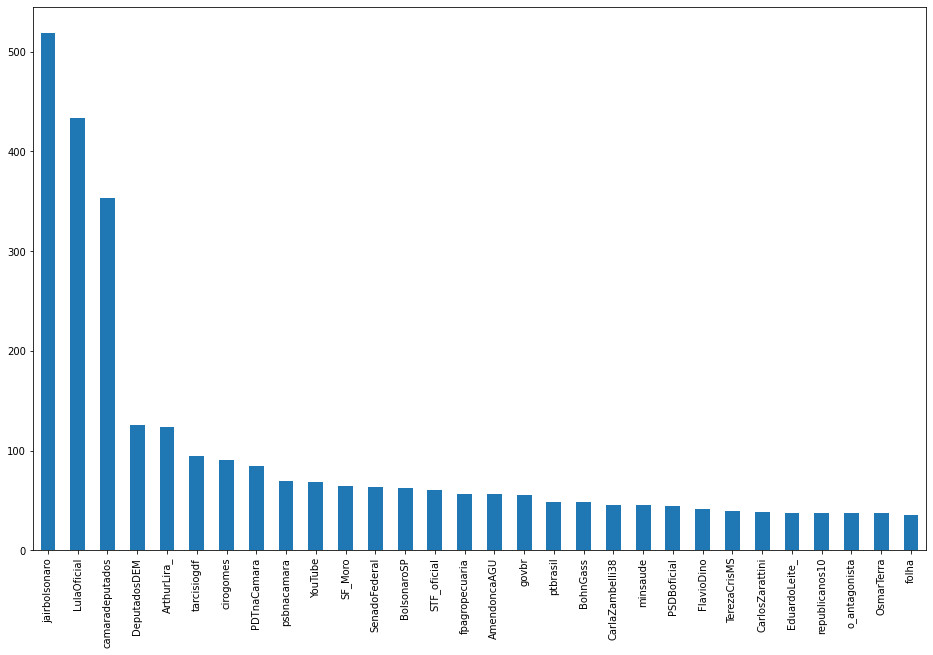

In [ ]:
plt.figure(figsize=(16,10))
df['Mencionou'].value_counts().head(30).plot(kind = 'bar')

#### Linha do tempo de tweets

In [ ]:
content_consolidado = []
for item in list_content:
  content_consolidado.extend(item)

[Status(_api=<tweepy.api.API object at 0x7fb8bee1efd0>, _json={'created_at': 'Thu Sep 30 20:58:20 +0000 2021', 'id': 1443681641470246914, 'id_str': '1443681641470246914', 'full_text': 'Federações partidárias são mais racionais do que as coligações por dois motivos: (1) manutenção pós-eleição; (2) verticalização. É um bom instituto de transição rumo a uma racionalização do sistema partidário no Brasil.', 'truncated': False, 'display_text_range': [0, 219], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 70542353, 'id_str': '70542353', 'name': 'Enrico Misasi', 'screen_name': 'enricomisasi', 'location': '', 'description': 'Advogado, mestre em Direito Constitucional e deputado federal (PV/SP).'

## Outras sugestões de atividade:

*   Analisar a popularidade e alcançabilidade dos senadores
*   Identificar quais são os perfis mais influentes em tweets que citem #ENEM
*   Análise de sentimento nos tweets



<div align=right>
<sub>Notebook Criado por: Alexandre Vaz Roriz</sub><br>
<sub>Minicurso: Minerando dados de Redes Sociais - Twitter </sub><br>
<sub>JornaCIA - 02/12/2021</sub><br>
</div>